In [5]:
import pandas as pd


data = pd.read_excel("/content/drive/MyDrive/MILab/Pipe/pipe_final.xlsx")
# data.head(20)
data.iloc[15:20]

,제품번호,외경/폭(mm),두께(mm),등록 길이(m),등록 중량(ton),step1 공정 시작 시간,step1 공정 완료 시간,step1 작업 시간(분),step2 공정 시작 시간,step2 공정 완료 시간,...,step4 공정 완료 시간,step4 작업 시간(분),step5 공정 시작 시간,step5 공정 완료 시간,step5 작업 시간(분),step6 공정 시작 시간,step6 공정 완료 시간,step6 작업 시간(분),내면용접 호기,외면용접 호기
15,23A003-31-009,1676.0,28.58,6.0,6.967,NaT,NaT,NaN,NaT,NaT,...,NaT,NaN,NaT,NaT,NaN,2023-06-24 09:00:00,2023-06-24 13:00:25,240.4,NaN,NaN
16,23A012-01-001,610.0,23.83,6.0,2.067,2023-06-08 18:26:37,2023-06-08 19:24:56,58.3,2023-06-08 19:39:42,2023-06-08 20:26:26,...,2023-06-09 15:34:32,4.2,2023-06-15 10:20:58,2023-06-15 10:29:02,8.1,2023-06-14 14:23:47,2023-06-14 14:46:37,22.8,1.0,3.0
17,23A012-02-001,914.0,12.70,11.8,3.332,2023-06-08 19:52:24,2023-06-08 20:08:32,16.1,2023-06-08 20:41:50,2023-06-08 21:00:00,...,2023-06-09 22:06:51,22.9,2023-06-10 02:37:33,2023-06-10 02:46:25,8.9,2023-06-10 07:23:45,2023-06-10 07:39:51,16.1,2.0,1.0
18,23A012-02-002,914.0,12.70,11.8,3.332,2023-06-08 20:08:32,2023-06-08 20:30:17,21.8,2023-06-08 21:23:17,2023-06-08 21:40:36,...,2023-06-09 23:05:48,0.1,2023-06-10 02:19:58,2023-06-10 02:28:38,8.7,2023-06-10 06:39:35,2023-06-10 06:48:26,8.8,3.0,3.0
19,23A012-02-003,914.0,12.70,11.8,3.332,2023-06-08 20:30:17,2023-06-08 20:49:29,19.2,2023-06-08 21:40:36,2023-06-08 21:50:36,...,2023-06-10 01:29:09,143.3,2023-06-10 02:28:45,2023-06-10 02:37:31,8.8,2023-06-10 06:48:26,2023-06-10 07:07:58,19.5,3.0,3.0


In [6]:
data["제품번호"][0]

'23A003-07-006'

In [7]:
"-".join( data["제품번호"][0].split("-")[0:2] )

'23A003-07'

In [8]:
# 중복없는 그룹명 들어있는 group list
group_list =[]
for i in range(len(data)):
  group = "-".join( data["제품번호"][i].split("-")[0:2] )
  # print(group)
  if group not in group_list :
    group_list.append(group)
print(group_list)
print("총 그룹명 개수 :",len(group_list))

['23A003-07', '23A003-08', '23A003-09', '23A003-18', '23A003-19', '23A003-20', '23A003-29', '23A003-30', '23A003-31', '23A012-01', '23A012-02', '23A012-03', '23A012-04', '23A029-19', '23B001-02', '23B004-15', '23C009-05', '23C009-06', '23C017-01', '23D002-48', '23D004-02', '23D007-02', '23D008-02', '23D013-01', '23D013-02', '23D016-01', '23D016-02', '23D016-03', '23D016-04', '23D016-05', '23D016-06', '23D017-06', '23D017-08', '23D017-12', '23D017-13', '23D017-14', '23D017-19', '23D017-20', '23D017-24', '23D017-28', '23D017-29', '23D017-30', '23D017-31', '23D017-32', '23D017-42', '23D017-49', '23D017-50', '23D017-51', '23D017-52', '23D018-01', '23D018-02', '23D018-03', '23D018-06', '23D018-09', '23D019-01', '23D020-03', '23D020-04', '23D021-01', '23D021-02', '23D021-03', '23D021-04', '23D021-05', '23D021-11', '23D021-14', '23D021-16', '23D021-17', '23D021-18', '23D021-20', '23D021-23', '23D021-25', '23D021-26', '23D021-27', '23D022-01', '23D023-01', '23D023-02', '23D023-03', '23D023-04'

# 이상치 제거 전 시각화



In [33]:
# step1에 대해서 해봄 이상치 시각화
import matplotlib.pyplot as plt

fig, axs = plt.subplots(31, 5, figsize=(40,240))  #155

for idx, a in enumerate(range(len(group_list))): # 그룹명수 155만큼
    name = group_list[a]
    draw_list = []

    for i in range(len(data)):
        group = "-".join(data["제품번호"][i].split("-")[0:2]) #그룹명. ex)23A003-07

        if name == group:
            draw_list.append(data["step1 작업 시간(분)"][i]) # step 1에 대해

    # idx를 2D 인덱스로 변환
    row = idx // 5  # 행 인덱스
    col = idx % 5   # 열 인덱스
    axs[row, col].scatter(draw_list, draw_list)  # 각 subplot에 scatter plot 추가
    axs[row, col].set_title(f'Group {name}')

plt.tight_layout()  # 레이아웃 자동 조정

# 위 plot 저장
plt.savefig("/content/drive/MyDrive/MILab/Pipe/step1_group_scatter_241005.png")
plt.show()  # 그래프 표시


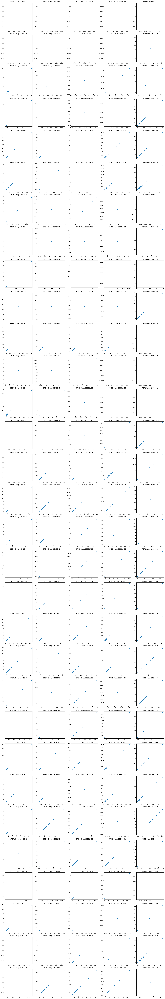

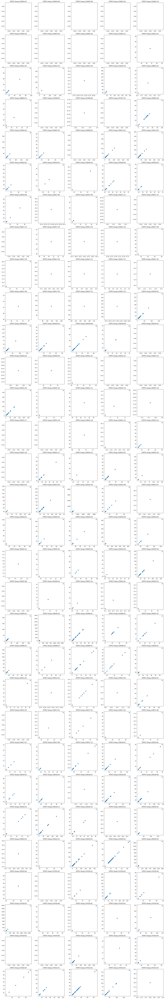

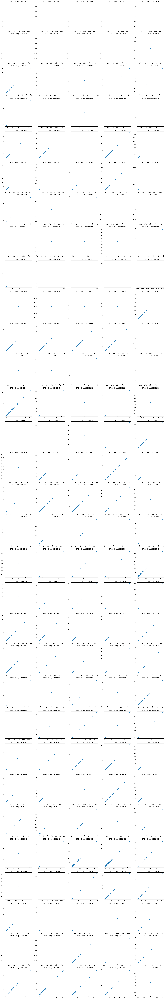

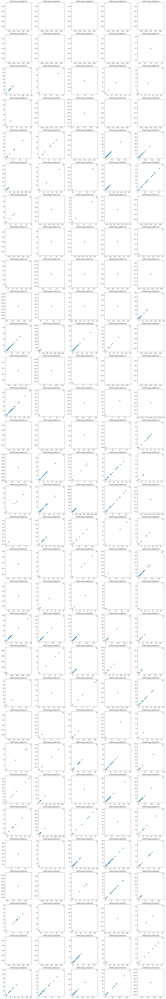

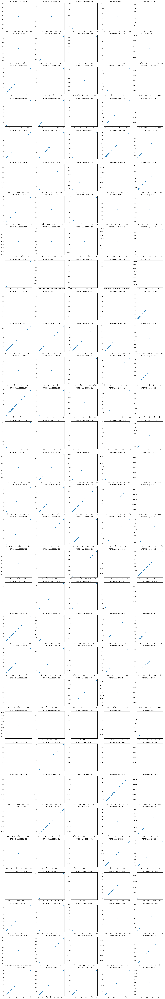

In [34]:
# 모든 STep에 대해 바꿈
import matplotlib.pyplot as plt

# Step 단계들을 리스트로 만듭니다.
steps = ['step1', 'step2', 'step3', 'step4', 'step6']

# 각 step마다 플롯을 나눠서 생성
for step in steps:
    fig, axs = plt.subplots(31, 5, figsize=(20, 120))  # step마다 별도의 figure 생성
    for idx, a in enumerate(range(len(group_list))):  # 그룹명수 155만큼
        name = group_list[a]
        draw_list = []

        # 그룹별 데이터 추출
        for i in range(len(data)):
            group = "-".join(data["제품번호"][i].split("-")[0:2])  # 그룹명 예: 23A003-07

            if name == group:
                draw_list.append(data[f"{step} 작업 시간(분)"][i])  # 각 step에 대한 작업 시간 추가

        # idx를 2D 인덱스로 변환
        row = idx // 5  # 행 인덱스
        col = idx % 5  # 열 인덱스

        # scatter plot 추가
        axs[row, col].scatter(draw_list, draw_list)
        axs[row, col].set_title(f'{step.upper()} Group {name}')

    # 레이아웃 자동 조정
    plt.tight_layout()

    # 위 plot 저장
    plt.savefig("/content/drive/MyDrive/MILab/Pipe/AllStep_group_scatter_241005.png")

    plt.show()  # 각 step의 그래프 표시


In [12]:
# 위 코드 모든 step scatter (각각) 함수로 변경
# 모든 STep에 대해 바꿈
import matplotlib.pyplot as plt

def AllStep_group_scatter(data, group_list, steps, save_path):

  # 각 step마다 플롯을 나눠서 생성
  for step in steps:
      fig, axs = plt.subplots(31, 5, figsize=(20, 120))  # step마다 별도의 figure 생성
      for idx, a in enumerate(range(len(group_list))):  # 그룹명수 155만큼
          name = group_list[a]
          draw_list = []

          # 그룹별 데이터 추출
          for i in range(len(data)):
              group = "-".join(data["제품번호"][i].split("-")[0:2])  # 그룹명 예: 23A003-07

              if name == group:
                  draw_list.append(data[f"{step} 작업 시간(분)"][i])  # 각 step에 대한 작업 시간 추가

          # idx를 2D 인덱스로 변환
          row = idx // 5  # 행 인덱스
          col = idx % 5  # 열 인덱스

          # scatter plot 추가
          axs[row, col].scatter(draw_list, draw_list)
          axs[row, col].set_title(f'{step.upper()} Group {name}')

      # 레이아웃 자동 조정
      plt.tight_layout()

      # 위 plot 저장
      plt.savefig(save_path)

      plt.show()  # 각 step의 그래프 표시

# # 함수 호출
# steps = ['step1'] # , 'step2', 'step3', 'step4', 'step6'
# save_path = "/content/drive/MyDrive/MILab/Pipe/AllStep_group_scatter_241006.png"
# group_list=group_list
# data=data
# AllStep_group_scatter(data, group_list, steps, save_path)

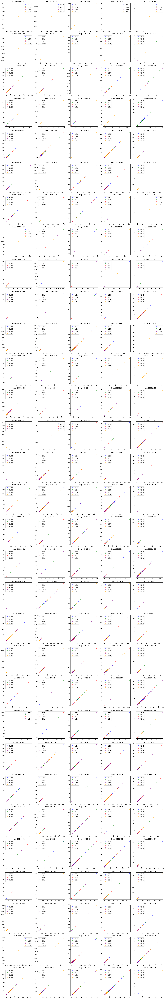

In [32]:
#색 . 다다르게 겹쳐서
import matplotlib.pyplot as plt

# Step 단계들을 리스트로 만듭니다.
steps = ['step1', 'step2', 'step3', 'step4', 'step6']

# 각 step에 대해 서로 다른 색상을 설정합니다.
colors = ['blue', 'green', 'red', 'purple', 'orange']

# 하나의 figure를 사용하여 모든 step 데이터를 그리기
fig, axs = plt.subplots(31, 5, figsize=(20, 120))  # 그룹별 서브플롯 생성

# 각 그룹에 대해 그래프를 그립니다.
for idx, a in enumerate(range(len(group_list))):  # 그룹명수 155만큼
    name = group_list[a]

    # idx를 2D 인덱스로 변환
    row = idx // 5  # 행 인덱스
    col = idx % 5  # 열 인덱스

    # 각 step에 대해 데이터 추가
    for step_idx, step in enumerate(steps):
        draw_list = []

        # 그룹별 데이터 추출
        for i in range(len(data)):
            group = "-".join(data["제품번호"][i].split("-")[0:2])  # 그룹명 예: 23A003-07

            if name == group:
                draw_list.append(data[f"{step} 작업 시간(분)"][i])  # 각 step에 대한 작업 시간 추가

        # 각 step별로 다른 색상으로 scatter plot 추가
        axs[row, col].scatter(draw_list, draw_list, color=colors[step_idx], label=f'{step.upper()}', alpha=0.5)

    axs[row, col].set_title(f'Group {name}')
    axs[row, col].legend()  # 범례 추가

# 레이아웃 자동 조정
plt.tight_layout()
# 위 plot 저장
plt.savefig("/content/drive/MyDrive/MILab/Pipe/AllInOne_group_scatter_241005.png")

plt.show()  # 모든 step의 그래프 표시

# 이상치 제거 후

In [22]:
# step1만
# 그룹별 수치 모아서 보기
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

results = []

for a in range(len(group_list)): # 155
  name = group_list[a]
  draw_list =[]

  for i in range(len(data)): # 전체 data
    group = "-".join( data["제품번호"][i].split("-")[0:2] )

    if name == group:
      draw_list.append(data["step1 작업 시간(분)"][i]) # 그룹 명 일치하는것만 모아서 LIst

  # draw_list를 Series로 변환, 그래야 quantile 사용가능
  draw_series = pd.Series(draw_list)

  # IQR 이상치 탐지
  Q1 = draw_series.quantile(0.25)
  Q3 = draw_series.quantile(0.75)
  IQR = Q3 - Q1
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR
  outliers = (draw_series < lower_bound) | (draw_series > upper_bound) | (draw_series > 100) # 100 넘는것도 필터링

  # 이상치 제거
  outliers_list = draw_series[outliers].tolist()
  draw_series = draw_series[~outliers].tolist()

  # 결과를 리스트에 저장
  results.append([name, outliers_list, draw_series])


  print(name,"이상치 목록 :", outliers_list)
  print(name ,"보존할 data 값 :", draw_series)

23A003-07 이상치 목록 : []
23A003-07 보존할 data 값 : [nan]
23A003-08 이상치 목록 : []
23A003-08 보존할 data 값 : [nan]
23A003-09 이상치 목록 : []
23A003-09 보존할 data 값 : [nan, nan, nan]
23A003-18 이상치 목록 : []
23A003-18 보존할 data 값 : [nan]
23A003-19 이상치 목록 : []
23A003-19 보존할 data 값 : [nan]
23A003-20 이상치 목록 : []
23A003-20 보존할 data 값 : [nan]
23A003-29 이상치 목록 : []
23A003-29 보존할 data 값 : [nan, nan, nan, nan]
23A003-30 이상치 목록 : []
23A003-30 보존할 data 값 : [nan, nan]
23A003-31 이상치 목록 : []
23A003-31 보존할 data 값 : [nan, nan]
23A012-01 이상치 목록 : []
23A012-01 보존할 data 값 : [58.3]
23A012-02 이상치 목록 : [10.5, 120.6]
23A012-02 보존할 data 값 : [16.1, 21.8, 19.2, 19.2, 17.4, 18.2, 16.5, 17.9, 17.1, 18.3, 18.0]
23A012-03 이상치 목록 : [112.7]
23A012-03 보존할 data 값 : [0.0, 31.1]
23A012-04 이상치 목록 : []
23A012-04 보존할 data 값 : [27.5]
23A029-19 이상치 목록 : [103.0, 127.1]
23A029-19 보존할 data 값 : [44.9, 47.9]
23B001-02 이상치 목록 : []
23B001-02 보존할 data 값 : [8.6, 5.8, 14.7]
23B004-15 이상치 목록 : []
23B004-15 보존할 data 값 : [nan, 9.4, 33.5]
23C009-05 이상치 목록 : []
2

In [36]:
# 결과를 DataFrame으로 변환
df_results = pd.DataFrame(results, columns=["제품번호", "step1 이상치 목록", "step1 보존할 data 값"])

# CSV 파일로 저장
path = '/content/drive/MyDrive/MILab/Pipe/'
df_results.to_csv(path + 'step1_outliers_241005.csv', index=False, encoding='utf-8-sig')  # UTF-8 인코딩 설정

print("데이터가 step1_outliers_241005.csv로 저장되었습니다.")

데이터가 step1_outliers_241005.csv로 저장되었습니다.


In [37]:
# step1_outliers_241005.csv 이상치 목록
pd.read_csv("/content/drive/MyDrive/MILab/Pipe/step1_outliers_241005.csv").head(35)

,제품번호,step1 이상치 목록,step1 보존할 data 값
0,23A003-07,[],[nan]
1,23A003-08,[],[nan]
2,23A003-09,[],"[nan, nan, nan]"
3,23A003-18,[],[nan]
4,23A003-19,[],[nan]
5,23A003-20,[],[nan]
6,23A003-29,[],"[nan, nan, nan, nan]"
7,23A003-30,[],"[nan, nan]"
8,23A003-31,[],"[nan, nan]"
9,23A012-01,[],[58.3]


In [45]:
# step 1개짜리 이상치제거후저장 XXXXX 154개?이렇게나옴 For문 쪼개야할듯
# 그룹별 수치 모아서 보기
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

data = pd.read_excel("/content/drive/MyDrive/MILab/Pipe/pipe_final.xlsx")


results = []

for a in range(len(group_list)): # 155
  name = group_list[a] # 23A003-07
  draw_list =[]        # 이상치 제거 전 그룹별 모든 datas, [14.0, 11.1, 18.3]

  for i in range(len(data)): # 전체 data
    group = "-".join( data["제품번호"][i].split("-")[0:2] )

    if name == group:
      draw_list.append(data["step1 작업 시간(분)"][i]) # 그룹 명 일치하는것만 모아서 LIst

  # draw_list를 Series로 변환, 그래야 quantile 사용가능
  draw_series = pd.Series(draw_list)

  # IQR 이상치 탐지
  Q1 = draw_series.quantile(0.25)
  Q3 = draw_series.quantile(0.75)
  IQR = Q3 - Q1
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR
  outliers = (draw_series < lower_bound) | (draw_series > upper_bound) | (draw_series > 100) # 100 넘는것도 필터링


  # data.insert(7,'lowerbound,upperbound'
  # 이상치 제거
  outliers_list = draw_series[outliers].tolist()
  draw_series = draw_series[~outliers].tolist()

  # 결과를 리스트에 저장
  # results.append([name, outliers_list, draw_series])


  # for i in range(len(data)): # 전체 data
      # 이상치 조건 생성 (논리식으로 직접 처리)
  # print(lower_bound)
  df_outliers = (data["step1 작업 시간(분)"] < lower_bound) | \
                  (data["step1 작업 시간(분)"] > upper_bound) | \
                  (data["step1 작업 시간(분)"] > 100)
  #   df_outliers = '''(data["step1 작업 시간(분)"].iloc[i] < lower_bound) |
  #                   (data["step1 작업 시간(분)"].iloc[i] > upper_bound) |
  #                   (data["step1 작업 시간(분)"].iloc[i] > 100)'''

  data_after = data[~df_outliers].reset_index(drop=True)
  # data_after.to_csv('/content/drive/MyDrive/MILab/Pipe/rightnow.csv', index=False, encoding='utf-8-sig')


  # print(name,"이상치 목록 :", outliers_list)
  # print(name ,"보존할 data 값 :", draw_series)

# step 1개짜리 이상치제거후저장

In [47]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

data = pd.read_excel("/content/drive/MyDrive/MILab/Pipe/pipe_final.xlsx")

# 그룹별 수치 모아서 보기
results = []
group_outlier_bounds = {}  # 각 그룹의 이상치 범위를 저장할 딕셔너리

for name in group_list:  # 그룹 리스트 순회
    draw_list = []  # 이상치 제거 전 그룹별 모든 데이터를 저장할 리스트

    for i in range(len(data)):  # 전체 데이터 반복
        group = "-".join(data["제품번호"][i].split("-")[0:2])  # 제품번호에서 그룹 추출

        if name == group:  # 그룹명이 일치하는 경우
            draw_list.append(data["step1 작업 시간(분)"][i])  # 그룹별 작업 시간 추가

    # draw_list를 Series로 변환, 그래야 quantile 사용 가능
    draw_series = pd.Series(draw_list)

    # IQR 이상치 탐지
    Q1 = draw_series.quantile(0.25)
    Q3 = draw_series.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # 각 그룹의 이상치 범위를 딕셔너리에 저장
    group_outlier_bounds[name] = (lower_bound, upper_bound)
# print(group_outlier_bounds)

# 전체 데이터프레임에서 이상치 제거
filtered_data = data.copy()

for i in range(len(filtered_data)):
    group = "-".join(filtered_data["제품번호"][i].split("-")[0:2])

    # 해당 그룹의 이상치 범위 가져오기
    lower_bound, upper_bound = group_outlier_bounds.get(group, (None, None))
    # print(lower_bound)
    # 그룹의 이상치 범위가 유효한 경우에만 체크
    if lower_bound is not None and upper_bound is not None:
        # 해당 행의 작업 시간이 그룹의 이상치 범위를 벗어나는지 확인
        if (filtered_data["step1 작업 시간(분)"][i] < lower_bound) or \
           (filtered_data["step1 작업 시간(분)"][i] > upper_bound) or \
           (filtered_data["step1 작업 시간(분)"][i] > 100):
            filtered_data = filtered_data.drop(i)

# 인덱스가 연속적으로 재설정
filtered_data = filtered_data.reset_index(drop=True)

# 결과를 CSV로 저장
filtered_data.to_csv('/content/drive/MyDrive/MILab/Pipe/rightnow.csv', index=False, encoding='utf-8-sig')

In [53]:
#그냥 필터링 테스트
small = data[29:39]
condition=data["step1 작업 시간(분)"]>100
filtered = small[~condition]
# print(filtered)
outliers = small[condition]
print(outliers)
# 필터링된 데이터 출력
from IPython.display import display

display(filtered)  # Jupyter Notebook에서 예쁘게 출력

             제품번호  외경/폭(mm)  두께(mm)  등록 길이(m)  등록 중량(ton)      step1 공정 시작 시간  \
29  23A012-02-013     914.0    12.7      11.8       3.332 2023-06-08 23:53:44   
32  23A012-03-003     914.0    12.7      11.5       3.247 2023-06-28 19:27:30   
34  23A029-19-001     914.0    34.0      11.0       8.117 2023-06-09 07:38:03   
37  23A029-19-004     914.0    34.0      11.0       8.117 2023-06-09 10:53:47   

        step1 공정 완료 시간  step1 작업 시간(분)      step2 공정 시작 시간  \
29 2023-06-09 01:54:20           120.6 2023-06-09 01:32:57   
32 2023-06-28 21:20:09           112.7 2023-06-28 19:53:38   
34 2023-06-09 09:21:01           103.0 2023-06-09 09:25:30   
37 2023-06-09 13:00:52           127.1 2023-06-09 11:36:08   

        step2 공정 완료 시간  ...      step4 공정 완료 시간 step4 작업 시간(분)  \
29 2023-06-09 02:31:21  ... 2023-06-09 16:35:19           26.3   
32 2023-06-28 23:41:48  ... 2023-06-29 02:06:49           41.3   
34 2023-06-09 10:04:07  ... 2023-06-12 14:59:17           11.7   
37 2023-06-09 14:50

<ipython-input-53-7f5204cd33e9>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  filtered = small[~condition]
<ipython-input-53-7f5204cd33e9>:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  outliers = small[condition]


,제품번호,외경/폭(mm),두께(mm),등록 길이(m),등록 중량(ton),step1 공정 시작 시간,step1 공정 완료 시간,step1 작업 시간(분),step2 공정 시작 시간,step2 공정 완료 시간,...,step4 공정 완료 시간,step4 작업 시간(분),step5 공정 시작 시간,step5 공정 완료 시간,step5 작업 시간(분),step6 공정 시작 시간,step6 공정 완료 시간,step6 작업 시간(분),내면용접 호기,외면용접 호기
30,23A012-03-001,914.0,12.70,11.5,3.247,2023-06-08 21:00:00,2023-06-08 21:00:00,0.0,2023-06-08 21:00:00,2023-06-08 21:00:00,...,2023-06-09 08:00:00,0.0,2023-06-10 05:28:53,2023-06-10 05:29:21,0.5,2023-06-10 07:07:58,2023-06-10 07:10:33,2.6,1.0,3.0
31,23A012-03-002,914.0,12.70,11.5,3.247,2023-06-08 21:00:00,2023-06-08 21:31:05,31.1,2023-06-08 21:00:00,2023-06-08 21:23:17,...,2023-06-09 08:32:32,32.5,2023-06-10 05:29:23,2023-06-10 05:29:24,0.0,2023-06-10 07:10:33,2023-06-10 07:23:45,13.2,1.0,3.0
33,23A012-04-001,914.0,12.70,6.1,1.722,2023-06-08 19:24:56,2023-06-08 19:52:24,27.5,2023-06-08 20:26:26,2023-06-08 20:41:50,...,2023-06-09 16:08:24,33.9,2023-06-09 21:03:55,2023-06-09 21:15:17,11.4,2023-06-10 04:20:01,2023-06-10 04:49:11,29.2,2.0,1.0
35,23A029-19-002,914.0,34.00,11.0,8.117,2023-06-09 09:21:01,2023-06-09 10:05:56,44.9,2023-06-09 10:04:07,2023-06-09 10:52:13,...,2023-06-12 16:45:48,8.2,2023-06-13 03:07:52,2023-06-13 03:25:13,17.4,2023-06-24 03:07:59,2023-06-24 03:31:34,23.6,1.0,1.0
36,23A029-19-003,914.0,34.00,11.0,8.117,2023-06-09 10:05:56,2023-06-09 10:53:47,47.9,2023-06-09 10:52:13,2023-06-09 11:36:08,...,2023-06-12 09:05:52,19.4,2023-06-12 15:24:21,2023-06-12 15:41:43,17.4,2023-06-24 03:31:34,2023-06-24 03:51:28,19.9,2.0,1.0
38,23B001-02-001,660.0,15.88,11.5,2.901,2023-06-28 01:44:44,2023-06-28 01:53:22,8.6,2023-06-28 06:36:16,2023-06-28 06:51:49,...,2023-06-28 11:53:22,32.4,2023-06-28 17:32:17,2023-06-28 17:41:39,9.4,NaT,NaT,NaN,2.0,2.0


# FINAL ) step 모두짜리 이상치제거후저장

In [11]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

data = pd.read_excel("/content/drive/MyDrive/MILab/Pipe/pipe_final.xlsx")

# 그룹별 수치 모아서 보기
group_outlier_bounds = {}  # 각 그룹의 이상치 범위를 저장할 딕셔너리

# 처리할 스텝 목록
steps = ['step1 작업 시간(분)', 'step2 작업 시간(분)', 'step3 작업 시간(분)', 'step4 작업 시간(분)', 'step6 작업 시간(분)']

# filtered_data 초기화
filtered_data = data.copy()

# 각 스텝에 대해 반복
for step in steps:
    group_outlier_bounds = {}  # 각 스텝별 그룹의 이상치 범위를 저장할 딕셔너리

    for name in group_list:  # 그룹 리스트 순회
        draw_list = []  # 이상치 제거 전 그룹별 모든 데이터를 저장할 리스트

        for i in range(len(filtered_data)):  # 전체 데이터 반복
            group = "-".join(filtered_data["제품번호"][i].split("-")[0:2])  # 제품번호에서 그룹 추출

            if name == group:  # 그룹명이 일치하는 경우
                draw_list.append(filtered_data[step][i])  # 그룹별 작업 시간 추가

        # draw_list를 Series로 변환
        draw_series = pd.Series(draw_list)

        # IQR 이상치 탐지
        Q1 = draw_series.quantile(0.25)
        Q3 = draw_series.quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # 각 그룹의 이상치 범위를 딕셔너리에 저장
        group_outlier_bounds[name] = (lower_bound, upper_bound)

    # 이상치를 제거할 인덱스를 저장할 리스트
    indices_to_remove = []

    for i in range(len(filtered_data)):
        group = "-".join(filtered_data["제품번호"][i].split("-")[0:2])

        # 해당 그룹의 이상치 범위 가져오기
        lower_bound, upper_bound = group_outlier_bounds.get(group, (None, None))

        # 그룹의 이상치 범위가 유효한 경우에만 체크
        if lower_bound is not None and upper_bound is not None:
            # 해당 행의 작업 시간이 그룹의 이상치 범위를 벗어나는지 확인
            if (filtered_data[step][i] < lower_bound) or \
               (filtered_data[step][i] <= 0) or \
               (filtered_data[step][i] >= 100) or \
               (filtered_data[step][i] > upper_bound):
                indices_to_remove.append(i)

    # 인덱스가 연속적으로 재설정
    filtered_data = filtered_data.drop(filtered_data.index[indices_to_remove]).reset_index(drop=True)

# 결과를 CSV로 저장
filtered_data.to_csv('/content/drive/MyDrive/MILab/Pipe/after_filtering_data.csv', index=False, encoding='utf-8-sig')

# 이상치 제거 후 시각화 allStep 각각 해보기

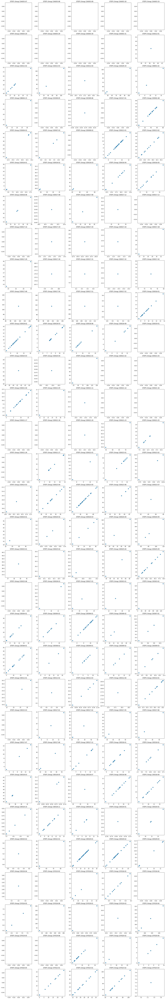

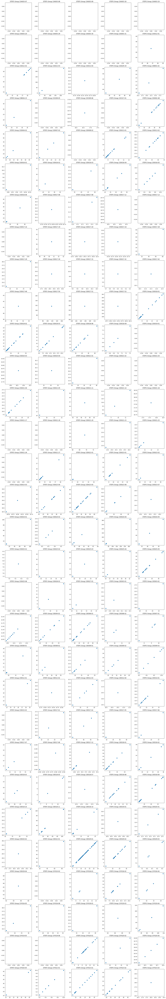

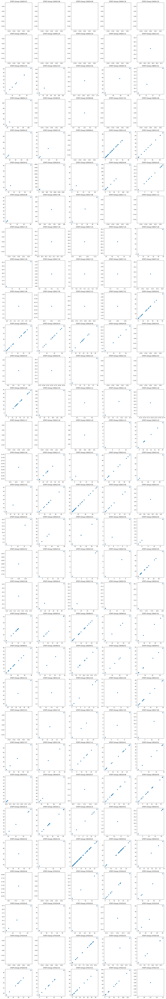

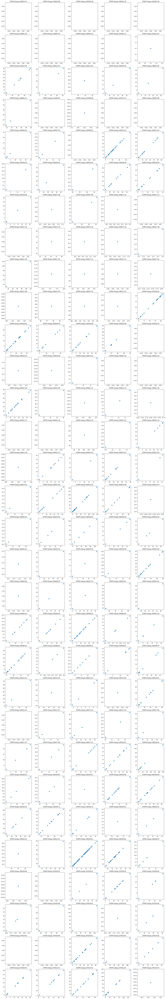

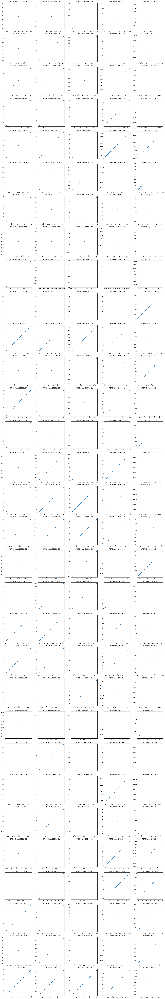

In [13]:
steps = ['step1', 'step2', 'step3', 'step4', 'step6'] #
save_path = "/content/drive/MyDrive/MILab/Pipe/After_AllStep_group_scatter_241006.png"
group_list = group_list
data = pd.read_csv('/content/drive/MyDrive/MILab/Pipe/after_filtering_data.csv')

AllStep_group_scatter(data, group_list, steps, save_path)

In [69]:
data = pd.read_excel("/content/drive/MyDrive/MILab/Pipe/pipe_final.xlsx")

data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1540 entries, 0 to 1539
Data columns (total 25 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   제품번호            1540 non-null   object        
 1   외경/폭(mm)        1540 non-null   float64       
 2   두께(mm)          1540 non-null   float64       
 3   등록 길이(m)        1540 non-null   float64       
 4   등록 중량(ton)      1540 non-null   float64       
 5   step1 공정 시작 시간  1396 non-null   datetime64[ns]
 6   step1 공정 완료 시간  1395 non-null   datetime64[ns]
 7   step1 작업 시간(분)  1395 non-null   float64       
 8   step2 공정 시작 시간  1409 non-null   datetime64[ns]
 9   step2 공정 완료 시간  1407 non-null   datetime64[ns]
 10  step2 작업 시간(분)  1407 non-null   float64       
 11  step3 공정 시작 시간  1406 non-null   datetime64[ns]
 12  step3 공정 완료 시간  1404 non-null   datetime64[ns]
 13  step3 작업 시간(분)  1404 non-null   float64       
 14  step4 공정 시작 시간  1418 non-null   datetime64[ns]
 15  step

In [14]:
ndata = pd.read_csv("/content/drive/MyDrive/MILab/Pipe/after_filtering_data.csv")
ndata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 973 entries, 0 to 972
Data columns (total 25 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   제품번호            973 non-null    object 
 1   외경/폭(mm)        973 non-null    float64
 2   두께(mm)          973 non-null    float64
 3   등록 길이(m)        973 non-null    float64
 4   등록 중량(ton)      973 non-null    float64
 5   step1 공정 시작 시간  854 non-null    object 
 6   step1 공정 완료 시간  853 non-null    object 
 7   step1 작업 시간(분)  853 non-null    float64
 8   step2 공정 시작 시간  859 non-null    object 
 9   step2 공정 완료 시간  857 non-null    object 
 10  step2 작업 시간(분)  857 non-null    float64
 11  step3 공정 시작 시간  854 non-null    object 
 12  step3 공정 완료 시간  853 non-null    object 
 13  step3 작업 시간(분)  853 non-null    float64
 14  step4 공정 시작 시간  864 non-null    object 
 15  step4 공정 완료 시간  863 non-null    object 
 16  step4 작업 시간(분)  863 non-null    float64
 17  step5 공정 시작 시간  858 non-null    obj

In [44]:
ndata.head(20)

,제품번호,외경/폭(mm),두께(mm),등록 길이(m),등록 중량(ton),step1 공정 시작 시간,step1 공정 완료 시간,step1 작업 시간(분),step2 공정 시작 시간,step2 공정 완료 시간,...,step4 공정 완료 시간,step4 작업 시간(분),step5 공정 시작 시간,step5 공정 완료 시간,step5 작업 시간(분),step6 공정 시작 시간,step6 공정 완료 시간,step6 작업 시간(분),내면용접 호기,외면용접 호기
0,23A003-07-006,1626.0,30.18,6.0,7.127,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,2023-06-26 11:34:29,2023-06-26 13:32:13,117.7,NaN,NaN
1,23A003-08-001,1676.0,23.83,6.0,5.826,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,2023-06-24 09:00:00,2023-06-24 09:00:00,0.0,NaN,NaN
2,23A003-09-003,1676.0,28.58,6.0,6.967,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,2023-06-25 02:40:39,2023-06-25 03:34:42,54.0,NaN,NaN
3,23A003-09-004,1676.0,28.58,6.0,6.967,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,2023-06-25 01:36:29,2023-06-25 02:40:39,64.2,NaN,NaN
4,23A003-09-006,1676.0,28.58,6.0,6.967,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,2023-06-24 23:18:20,2023-06-25 01:36:29,138.2,NaN,NaN
5,23A003-18-008,1626.0,30.18,6.0,7.127,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,2023-06-26 14:58:09,2023-06-26 16:33:11,95.0,NaN,NaN
6,23A003-19-003,1676.0,23.83,6.0,5.826,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,2023-06-24 13:00:25,2023-06-24 14:12:07,71.7,NaN,NaN
7,23A003-20-012,1676.0,28.58,6.0,6.967,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,2023-06-25 04:38:31,2023-06-26 08:17:03,1658.5,NaN,NaN
8,23A003-29-004,1626.0,30.18,6.0,7.127,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,2023-06-26 09:57:35,2023-06-26 11:34:29,96.9,NaN,NaN
9,23A003-29-005,1626.0,30.18,6.0,7.127,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,2023-06-26 13:32:13,2023-06-26 14:58:09,85.9,NaN,NaN
